In [31]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [64]:
pip install geopandas

In [33]:
pip install lonboard

In [63]:
import zipfile
import os
folder_with_zips = '/content/drive/MyDrive/Colab Notebooks/Data/'
output_dir = '/content/drive/MyDrive/Colab Notebooks/Data/'
os.makedirs(output_dir, exist_ok=True)
for filename in os.listdir(folder_with_zips):
    file_path = os.path.join(folder_with_zips, filename)

    if filename.endswith('.zip'):
        with zipfile.ZipFile(file_path, 'r') as zip_ref:

            folder_name = os.path.splitext(filename)[0]
            folder_path = os.path.join(output_dir, folder_name)
            os.makedirs(folder_path, exist_ok=True)

            zip_ref.extractall(folder_path)




In [61]:
import numpy as np
import pandas as pd
import geopandas as gpd
from sklearn.cluster import KMeans, DBSCAN
import shapely
import folium
from lonboard import Map, ScatterplotLayer

In [67]:
import folium
import geopandas as gpd
from IPython.display import display
import matplotlib.pyplot as plt

Part 6

T1:

In [36]:
chicago_geo = gpd.read_file('/content/drive/MyDrive/Colab Notebooks/Data/Chicago')

In [65]:
chicago_geo.head()

,POLY_ID,ID,AREA,PIN_OLD,PIN,geometry,Latitude,Longitude,kmeans_cluster_5,kmeans_cluster_3,kmeans_cluster_4,dbscan_cluster_40,dbscan_cluster_15,dbscan_cluster_5,dbscan_cluster_50,centroid,latitude,longitude
0,1,93,0.01,836300010,836300010,"POLYGON ((-87.93993 42.00015, -87.93996 42.000...",42.000558,-87.937727,0,0,0,0,-1,-1,-1,POINT (-87.93773 42.00056),42.000558,-87.937727
1,2,94,0.00,836300011,836300011,"POLYGON ((-87.93533 42.00096, -87.93521 42.000...",42.000804,-87.935347,0,0,0,0,0,-1,-1,POINT (-87.93535 42.0008),42.000804,-87.935347
2,3,96,0.02,836300013,836300013,"POLYGON ((-87.93573 42.00033, -87.93581 42.000...",41.999609,-87.938070,0,0,0,0,-1,-1,-1,POINT (-87.93807 41.99961),41.999609,-87.938070
3,4,95,0.01,836300012,836300012,"POLYGON ((-87.93684 41.99893, -87.93694 41.998...",41.998643,-87.938628,0,0,0,0,-1,-1,-1,POINT (-87.93863 41.99864),41.998643,-87.938628
4,5,92,0.01,836300009,836300009,"POLYGON ((-87.93704 41.99863, -87.93719 41.998...",41.997929,-87.938614,0,0,0,0,-1,-1,-1,POINT (-87.93861 41.99793),41.997929,-87.938614


T2:

In [66]:
chicago_geo.total_bounds

array([-87.939958,  41.644504, -87.524508,  42.02669 ])

T3:

In [ ]:
from lonboard import Map, SolidPolygonLayer

In [21]:
layer = SolidPolygonLayer.from_geopandas(
    gdf,
    get_fill_color=[255, 0, 0],
)
map_1 = Map(layer)
map_1

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


Map(custom_attribution='', layers=(SolidPolygonLayer(get_fill_color=[255, 0, 0], table=arro3.core.Table
------…

T4:

In [ ]:
import seaborn as sns

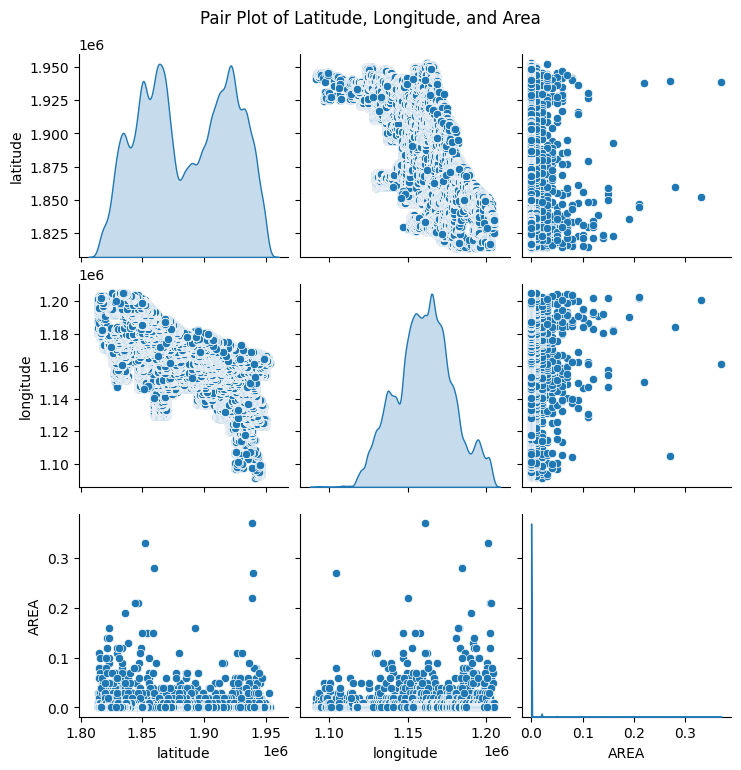

In [22]:
chicago_geo['centroid'] = chicago_geo.geometry.centroid
chicago_geo['latitude'] = chicago_geo['centroid'].y
chicago_geo['longitude'] = chicago_geo['centroid'].x

data = chicago_geo[['latitude', 'longitude', 'AREA']]
sns.pairplot(data, diag_kind='kde', markers='o')
plt.suptitle('Pair Plot of Latitude, Longitude, and Area', y=1.02)
plt.show()

T5:

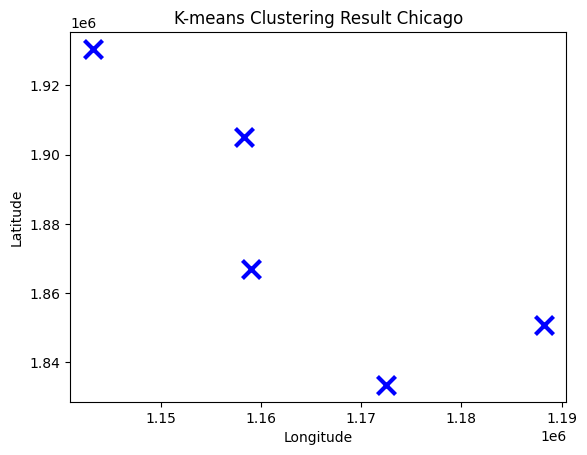

In [23]:
chicago_geo['centroid'] = chicago_geo.geometry.centroid
chicago_geo['X'] = chicago_geo['centroid'].x
chicago_geo['Y'] = chicago_geo['centroid'].y

kmeans = KMeans(n_clusters=5, random_state=42)
chicago_geo['kmeans_cluster'] = kmeans.fit_predict(chicago_geo[['X', 'Y']])

centroids = kmeans.cluster_centers_
plt.scatter(
    centroids[:, 0],
    centroids[:, 1],
    marker="x",
    s=169,
    linewidths=3,
    color="b",
    zorder=10
)

plt.title('K-means Clustering Result Chicago')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

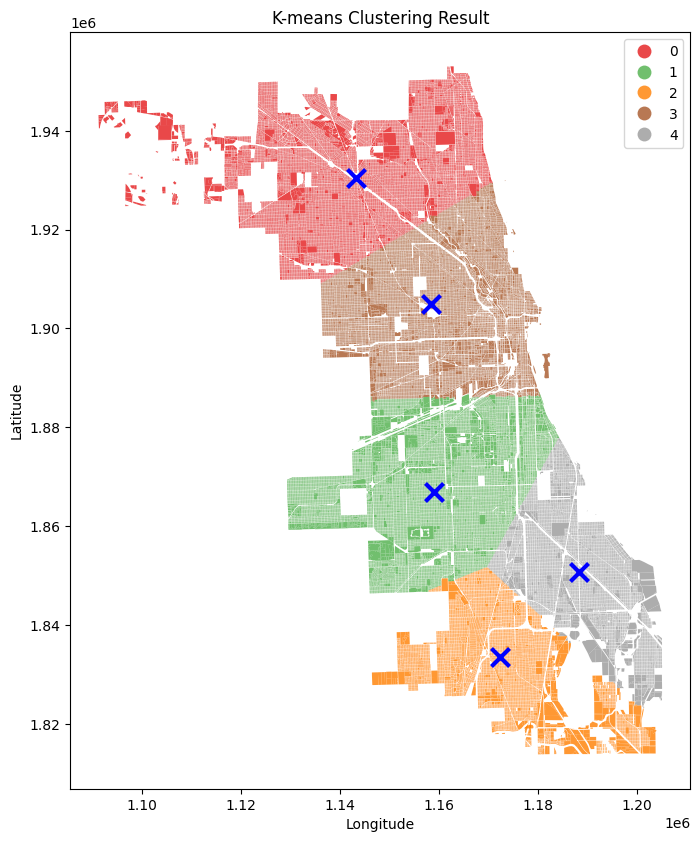

In [ ]:
chicago_geo['centroid'] = chicago_geo.geometry.centroid
chicago_geo['X'] = chicago_geo['centroid'].x
chicago_geo['Y'] = chicago_geo['centroid'].y

kmeans = KMeans(n_clusters=5, random_state=42)
chicago_geo['kmeans_cluster'] = kmeans.fit_predict(chicago_geo[['X', 'Y']])

ax = chicago_geo.plot(column='kmeans_cluster', categorical=True, legend=True, figsize=(8, 12), cmap='Set1',alpha=0.8)


centroids = kmeans.cluster_centers_
plt.scatter(
    centroids[:, 0],
    centroids[:, 1],
    marker="x",
    s=169,
    linewidths=3,
    color="b",
    zorder=10
)

plt.title('K-means Clustering Result')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


T6:

In [40]:
if not chicago_geo.crs or chicago_geo.crs.to_string() != "EPSG:4326":
    chicago_geo = chicago_geo.to_crs(epsg=4326)
chicago_geo['Latitude'] = chicago_geo.geometry.centroid.y
chicago_geo['Longitude'] = chicago_geo.geometry.centroid.x

<ipython-input-40-c891f4589c8e>:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  chicago_geo['Latitude'] = chicago_geo.geometry.centroid.y
<ipython-input-40-c891f4589c8e>:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  chicago_geo['Longitude'] = chicago_geo.geometry.centroid.x


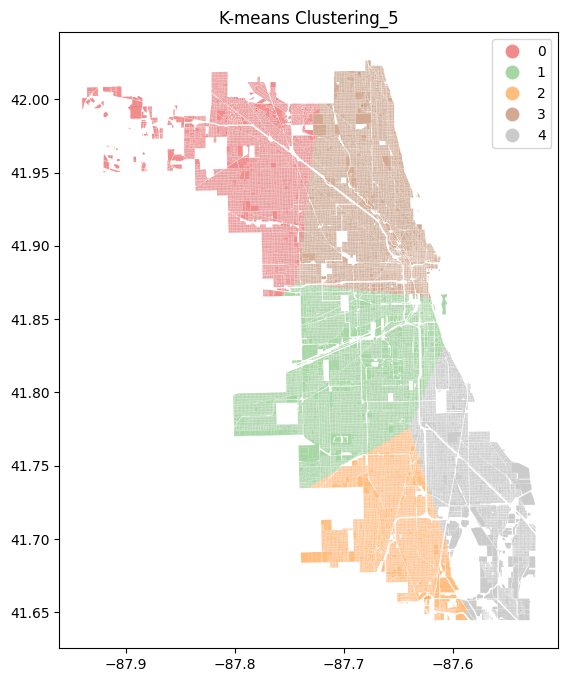

In [41]:
kmeans = KMeans(n_clusters=5, random_state=42)
chicago_geo['kmeans_cluster_5'] = kmeans.fit_predict(chicago_geo[['Longitude', 'Latitude']])
fig, ax = plt.subplots(figsize=(7, 8))

chicago_geo.plot(ax=ax,column='kmeans_cluster_5',categorical=True,legend=True,markersize=1,alpha=0.5,cmap='Set1')
ax.set_title('K-means Clustering_5')
plt.show()

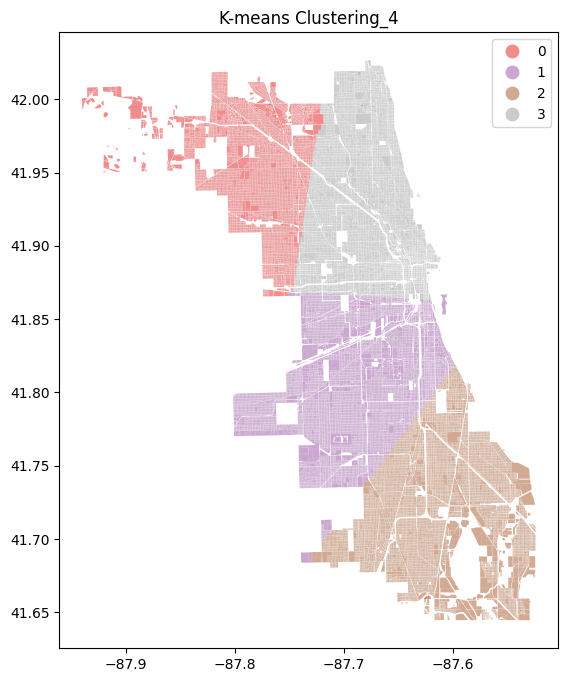

In [48]:
kmeans = KMeans(n_clusters=4, random_state=42)
chicago_geo['kmeans_cluster_4'] = kmeans.fit_predict(chicago_geo[['Longitude', 'Latitude']])

fig, ax = plt.subplots(figsize=(7, 8))

chicago_geo.plot(ax=ax,column='kmeans_cluster_4',categorical=True,legend=True,markersize=1,alpha=0.5,cmap='Set1')
ax.set_title('K-means Clustering_4')
plt.show()

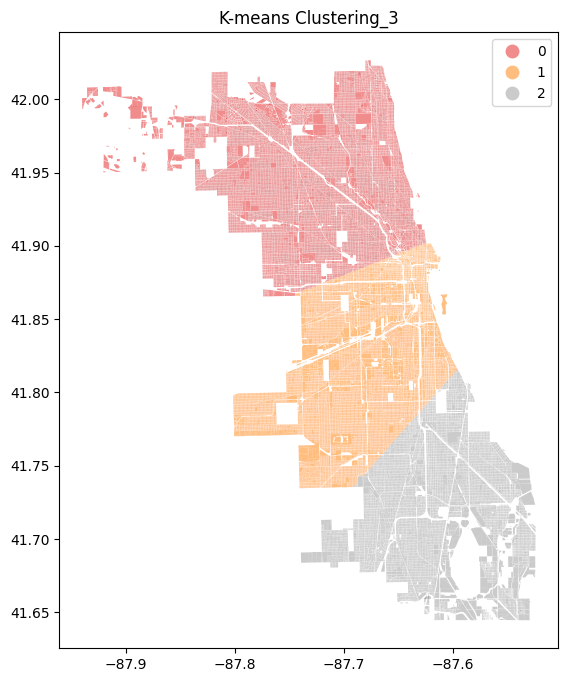

In [44]:
kmeans = KMeans(n_clusters=3, random_state=42)
chicago_geo['kmeans_cluster_3'] = kmeans.fit_predict(chicago_geo[['Longitude', 'Latitude']])

fig, ax = plt.subplots(figsize=(7, 8))

chicago_geo.plot(ax=ax,column='kmeans_cluster_3',categorical=True,legend=True,markersize=1,alpha=0.5,cmap='Set1')
ax.set_title('K-means Clustering_3')
plt.show()

T6



In [ ]:
pip install pyarrow
from lonboard import Map, PolygonLayer
import pyarrow

In [37]:

chicago_geo = chicago_geo[chicago_geo.geometry.notnull()]

if chicago_geo.crs != "EPSG:3857":
    chicago_geo = chicago_geo.to_crs("EPSG:3857")

chicago_geo = chicago_geo.drop(columns=['centroid'], errors='ignore')
chicago_geo = chicago_geo[chicago_geo.is_valid]

layer = PolygonLayer.from_geopandas(chicago_geo)

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


In [38]:
layer_1 = PolygonLayer.from_geopandas(chicago_geo)
map_1 = Map(layers=[layer_1], _height=400)
map_1

/usr/local/lib/python3.10/dist-packages/lonboard/_geoarrow/ops/reproject.py:107: UserWarning: Input being reprojected to EPSG:4326 CRS.
Lonboard is only able to render data in EPSG:4326 projection.
  warnings.warn(


Map(custom_attribution='', layers=(PolygonLayer(table=arro3.core.Table
-----------
POLY_ID: UInt32
ID: UInt32
…

In [42]:
categories_kmeans = chicago_geo['kmeans_cluster_5'].unique()
colors_kmeans = sns.color_palette("magma", len(categories_kmeans))
color_dict_kmeans = dict(zip(categories_kmeans, colors_kmeans))

color_array_kmeans = np.array([tuple(np.append(np.multiply(color_dict_kmeans.get(x, (0, 0, 0)), 255).astype(int), 255)) for x in chicago_geo['kmeans_cluster_5']], dtype=np.uint8)

layer_1.radius_scale = 50
layer_1.opacity = 0.05
layer_1.get_fill_color = color_array_kmeans

In [43]:
layer_2 = PolygonLayer.from_geopandas(chicago_geo)
map_2 = Map(layers=[layer_2], _height=400)
map_2

Map(custom_attribution='', layers=(PolygonLayer(table=arro3.core.Table
-----------
POLY_ID: UInt32
ID: UInt32
…

In [45]:
categories_kmeans = chicago_geo['kmeans_cluster_3'].unique()
colors_kmeans = sns.color_palette("viridis", len(categories_kmeans))
color_dict_kmeans = dict(zip(categories_kmeans, colors_kmeans))

color_array_kmeans = np.array([tuple(np.append(np.multiply(color_dict_kmeans.get(x, (0, 0, 0)), 255).astype(int), 255)) for x in chicago_geo['kmeans_cluster_3']], dtype=np.uint8)

layer_2.radius_scale = 50
layer_2.opacity = 0.05
layer_2.get_fill_color = color_array_kmeans

In [46]:
layer_3 = PolygonLayer.from_geopandas(chicago_geo)
map_3 = Map(layers=[layer_3], _height=400)
map_3

Map(custom_attribution='', layers=(PolygonLayer(table=arro3.core.Table
-----------
POLY_ID: UInt32
ID: UInt32
…

In [49]:
categories_kmeans = chicago_geo['kmeans_cluster_4'].unique()
colors_kmeans = sns.color_palette("cividis", len(categories_kmeans))
color_dict_kmeans = dict(zip(categories_kmeans, colors_kmeans))

color_array_kmeans = np.array([tuple(np.append(np.multiply(color_dict_kmeans.get(x, (0, 0, 0)), 255).astype(int), 255)) for x in chicago_geo['kmeans_cluster_4']], dtype=np.uint8)

layer_3.radius_scale = 50
layer_3.opacity = 0.05
layer_3.get_fill_color = color_array_kmeans

T7:

Analysing the scatterplots and cluster maps; 3 is the optimal value of n_clusters. As there are significant concentarions in (i) the North-West and North-East, (ii) South-East and  (iii) Central zone of Chicago.

T8:

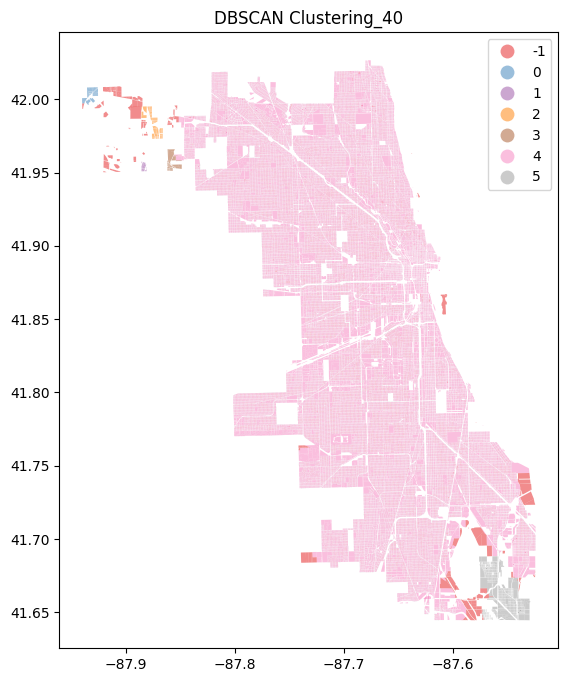

In [50]:
dbscan = DBSCAN(eps=0.005, min_samples=40)
chicago_geo['dbscan_cluster_40'] = dbscan.fit_predict(chicago_geo[['Longitude', 'Latitude']])

fig, ax = plt.subplots(figsize=(7, 8))

chicago_geo.plot(ax=ax,column='dbscan_cluster_40',categorical=True,legend=True,markersize=1,alpha=0.5,cmap='Set1')
ax.set_title('DBSCAN Clustering_40')
plt.show()

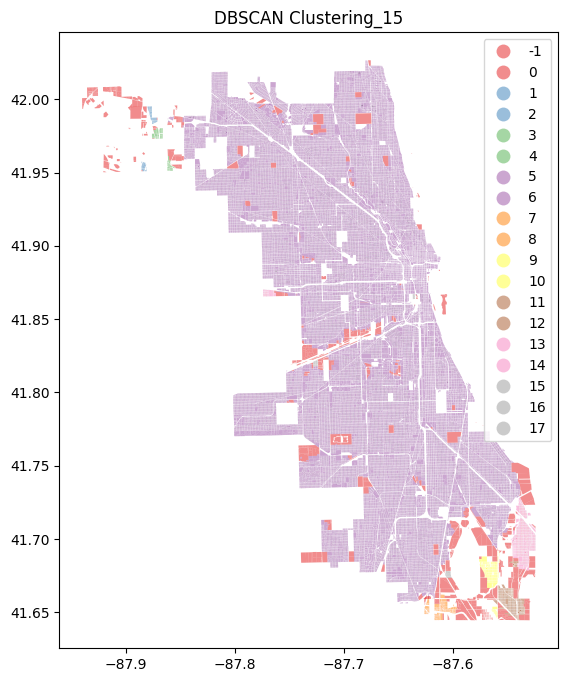

In [51]:
dbscan = DBSCAN(eps=0.002, min_samples=15)
chicago_geo['dbscan_cluster_15'] = dbscan.fit_predict(chicago_geo[['Longitude', 'Latitude']])

fig, ax = plt.subplots(figsize=(7, 8))
chicago_geo.plot(ax=ax,column='dbscan_cluster_15',categorical=True,legend=True,markersize=1,alpha=0.5,cmap='Set1')
ax.set_title('DBSCAN Clustering_15')
plt.show()

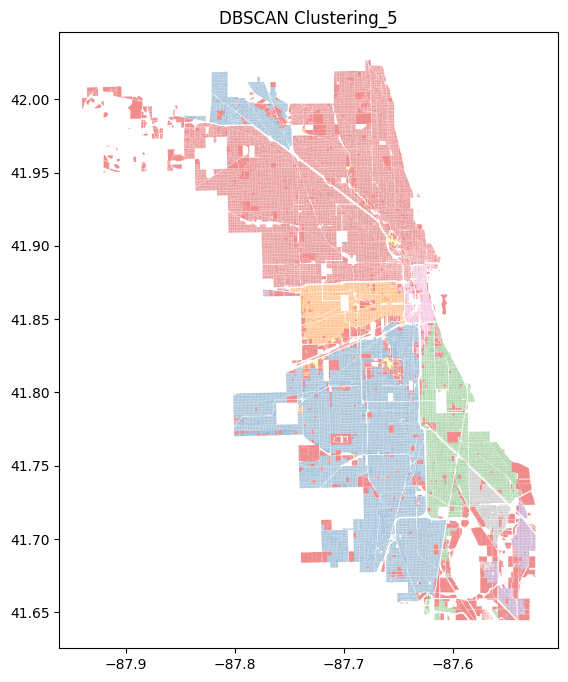

In [52]:
dbscan = DBSCAN(eps=0.001, min_samples=5)
chicago_geo['dbscan_cluster_5'] = dbscan.fit_predict(chicago_geo[['Longitude', 'Latitude']])

fig, ax = plt.subplots(figsize=(7, 8))

chicago_geo.plot(ax=ax,column='dbscan_cluster_5',categorical=True,markersize=1,alpha=0.5,cmap='Set1')
ax.set_title('DBSCAN Clustering_5')
plt.show()

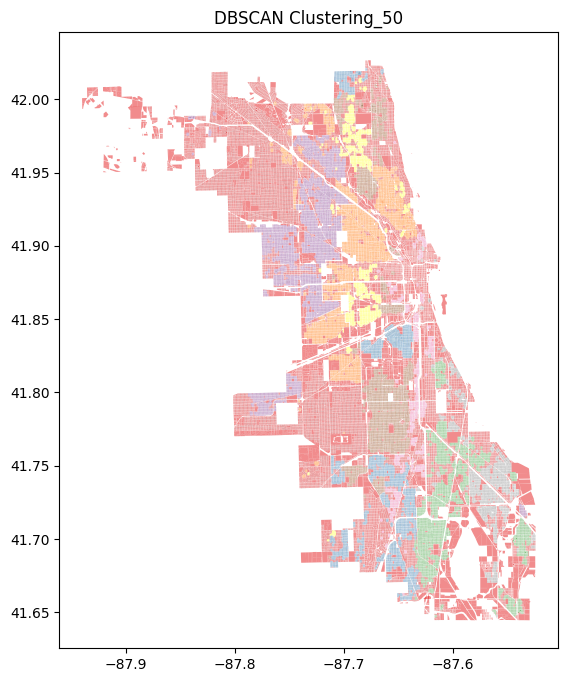

In [53]:
dbscan = DBSCAN(eps=0.001, min_samples=50)
chicago_geo['dbscan_cluster_50'] = dbscan.fit_predict(chicago_geo[['Longitude', 'Latitude']])

fig, ax = plt.subplots(figsize=(7, 8))

chicago_geo.plot(ax=ax,column='dbscan_cluster_50',categorical=True,markersize=1,alpha=0.5,cmap='Set1')
ax.set_title('DBSCAN Clustering_50')
plt.show()

(Couldn't put eps over 0.005 as session would crash as would use all avaliable RAM).

T9:

<ipython-input-68-acaa91a05846>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  chicago_geo['centroid'] = chicago_geo.geometry.centroid


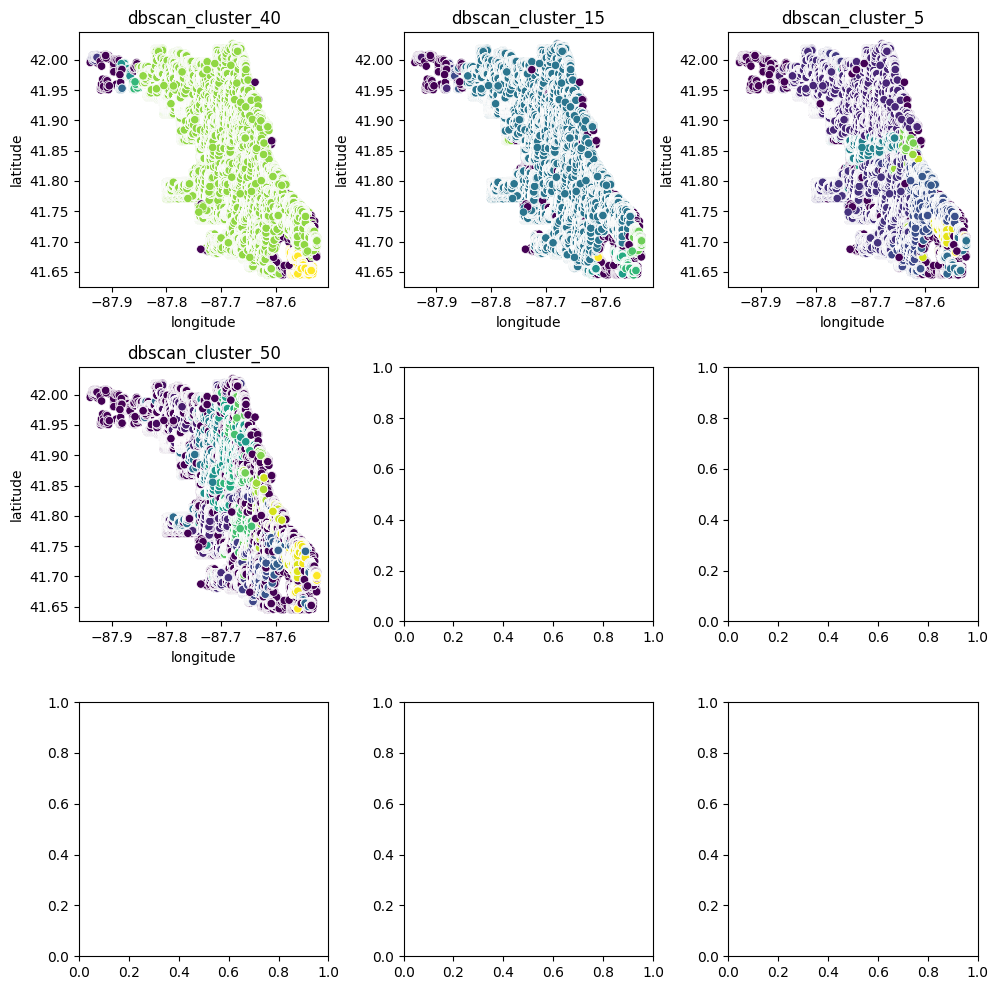

In [68]:
chicago_geo['centroid'] = chicago_geo.geometry.centroid
chicago_geo['latitude'] = chicago_geo['centroid'].y
chicago_geo['longitude'] = chicago_geo['centroid'].x

cluster_columns = ['dbscan_cluster_40', 'dbscan_cluster_15', 'dbscan_cluster_5', 'dbscan_cluster_50']

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
axes_flat = axes.flatten()

for i, col in enumerate(cluster_columns):
    sns.scatterplot(x='longitude', y='latitude', hue=col, data=chicago_geo, palette='viridis', ax=axes_flat[i],legend=False)
    axes_flat[i].set_title(f'{col}')

plt.tight_layout()
plt.show()

T10:

Due to there being sa large number of datapoints and therefore dense areas of parcels in the Chicago dataset, striking a balance between eps and min_samples is important in order to best present the relationship between area size and tax parcels. As such, a relatively higher eps and min samples values (DBSCAN Clustering_40) resulted in clustering that was too loose and did not best visualise the dense cluster patterns in the dataset. Conversely, a lower eps can visualise these tighter clusters, however pairing it with a low and high  min samples (DBSCAN_Clustering_5 and DBSCAN_Clustering_50) resulted in clusters that were too large and unable to strike the balance between adequately displaying the dense clusters as outlined by the first scatterplot graphs. DBSCAN Clustering_15 strikes this balance, with an eps low enough to group dense parcels and a min sample high enough to display larger, more significant clusters with high densities. For future urban planning, attention must be given to a variety of data visualisation methods (i.e. scatterplots and histograms) so that clusters are not seen in isolation. This ensures a more nuanced analysis of a datasets spatial dimensions. In the future, such data-driven analysis should be paired with qualitative and empirical research to inform holistic policies.